# <center>Introduction/Business Problem<center>

Chicago is a popular city for many individuals and families seeking to relocate. With a steady jobs market, unique neighborhoods and storied history, Chicago can be a home to people from many different backgrounds. However, given the myriad living options in Chicago, it can be difficult to choose the areas of the city that best fit the lifestyle choices, safety demands and housing budget of a prospective Chicagoan. 

According to [Forbes](https://www.forbes.com/sites/learnvest/2017/08/02/10-things-you-should-look-for-when-choosing-a-new-neighborhood/#1f21bf635fbc) and [Bankrate](https://www.bankrate.com/real-estate/how-to-find-a-good-neighborhood/), the top factors in choosing a neighborhood are:

 * Safety  
 * Home Prices/Rent
 * Socioeconomic indicators (per capita income, unemployment, etc.)
 * School Quality  
 * Proximity to Services (Public Transportation, Grocery, Dining, Shopping, Parks, etc.)

Identifying trends across safety, school quality, socioeconomic strata and services, suitable living areas can be identified and compared with the characteristics of individuals to determine which areas in the city best fit their desired lifestyles.

# <center>Data<center>

The data that will be used to solve this problem will be a combination of data from the [Chicago Data Portal](https://data.cityofchicago.org/), [Quandl API](https://blog.quandl.com) and the [Foursquare API](https://developer.foursquare.com/docs/). 

Safety/Crime Data will be sourced from the crime reports for the [Crimes - 2001 to present](https://data.cityofchicago.org/Public-Safety/Crimes-2020/qzdf-xmn8) dataset. This data clearly details the date, type, and location of crimes committed.

Rent for a specific ZIP code or community area will be found using the [Quandl API for Housing Data](https://blog.quandl.com/api-for-housing-data). This API allows unlimited calls and returns data for a location or ZIP code including Estimated Rent for all homes in the region, price-to-rent ratio and many other factors that play into changes in housing data over time.

Socioeconomic status and public health indicators will be used to determine the expense associated with living in a given community. This data will be sourced from the [Selected socioeconomic indicators 2008-2012 data](https://data.cityofchicago.org/Health-Human-Services/Census-Data-Selected-socioeconomic-indicators-in-C/kn9c-c2s2) This data identifies overall socioeconomic factors and public health indicators for each of the community areas in Chicago, including per capita income, hardship index, and unemployment for those over the age of 16.

School Quality will be assessed using the [Chicago Public Schools - Progress Report Cards (2011-2012)](https://data.cityofchicago.org/Education/Chicago-Public-Schools-Progress-Report-Cards-2011-/9xs2-f89t) dataset. This dataset shows all school level performance data for 2011-2012.

Finally, the Foursquare API will be used to gather data on the services available to members of each of the Chicago community areas.

# <center> Data Methodology <center>

Import the necessary packages, and set the maximum row and column displays so we can see the full dataframe if we want.

In [1]:
# for basic dataframe and math operations
import pandas as pd
pd.set_option("display.max_rows", None, "display.max_columns", None)

import numpy as np

# for plotting
import seaborn as sns
import matplotlib.pyplot as plt

!conda install -c conda-forge geopy --yes # install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

!conda install quandl --yes; # install quandl for collecting rent information
import quandl

quandl_api_key = "b_KYkGKLvRCMEJ31kzjN" # user's quandl API key
quandl.ApiConfig.api_key = quandl_api_key

# for some arithmetic functions
import math

# for linear modeling
from sklearn import linear_model
from sklearn.metrics import r2_score

# import k-means from clustering sklearn package
from sklearn.cluster import KMeans

# install folium for map plotting 
!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

import json # library to handle JSON files
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# to scale data for K-Means clustering
from sklearn.preprocessing import StandardScaler

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

Solving environment: done

# All requested packages already installed.

Solving environment: done

## Package Plan ##

  environment location: /Users/siyer/opt/anaconda3

  added / updated specs:
    - quandl


The following packages will be SUPERSEDED by a higher-priority channel:

  conda              conda-forge::conda-4.8.3-py37hc8dfbb8~ --> pkgs/main::conda-4.8.3-py37_0


Preparing transaction: done
Verifying transaction: done
Executing transaction: done
Solving environment: done

## Package Plan ##

  environment location: /Users/siyer/opt/anaconda3

  added / updated specs:
    - folium=0.5.0


The following packages will be UPDATED:

  conda                       pkgs/main::conda-4.8.3-py37_0 --> conda-forge::conda-4.8.3-py37hc8dfbb8_1


Preparing transaction: done
Verifying transaction: done
Executing transaction: done


## <center> 1. Public School Performance Data <center>

### <center> Data Wrangling - Public School Data <center>

Let's import the public school data from the City of Chicago dataset.

In [5]:
school = pd.read_json('https://data.cityofchicago.org/resource/9xs2-f89t.json')

#### <center> Public School Community Area Table Extraction <center>

From the dataframe, we can extract the community area numbers and names as a separate dataframe and cross-reference with the community areas from the other datasets.

In [6]:
CA = school[['community_area_number','community_area_name']]

In [7]:
CA.shape

(566, 2)

Let's remove the duplicate community areas

In [8]:
CA = CA.drop_duplicates().sort_values("community_area_number")

And reset the index:

In [9]:
CA=CA.reset_index(drop=True)

There are 77 neighborhoods/community areas in Chicago - let's confirm this by checking the shape of school_ca

In [10]:
CA.shape

(77, 2)

In [11]:
CA

,community_area_number,community_area_name
0,1,ROGERS PARK
1,2,WEST RIDGE
2,3,UPTOWN
3,4,LINCOLN SQUARE
4,5,NORTH CENTER
5,6,LAKE VIEW
6,7,LINCOLN PARK
7,8,NEAR NORTH SIDE
8,9,EDISON PARK
9,10,NORWOOD PARK


#### <center> Cleaning Data for CPS Dataframe <center>

Let's make CPS the dataframe of the school quality data and location data for each school. Since much of the information regarding graduation rate and college eligibility is unavailable for a majority of the schools recorded in the dataset, the Average Student Attendance, CPS Performance Policy Level and Safety Score will be used as our metrics for determining school quality.

In [12]:
cps = school[['school_id', 'name_of_school','average_student_attendance','cps_performance_policy_level', 'safety_score',
              'adequate_yearly_progress_made_','street_address', 'latitude','longitude','community_area_number','community_area_name','ward','police_district']]

The CPS Performance Policy Level is a good general indicator of school quality, so let's remove the invalid data.

In [13]:
cps['cps_performance_policy_level'].value_counts() # count the frequency of each Level occurrance

Level 2            215
Level 3            187
Level 1            139
Not Enough Data     20
NDA                  5
Name: cps_performance_policy_level, dtype: int64

Remove 'Not Enough Data' and 'NDA' rows from the field "CPS Performance Policy Level." Let's also remove invalid values from the 'adequate_yearly_progress_made_' field and encode the "Yes" and "No" responses to zeros and ones.

In [14]:
# select only the rows with valid data
cps = cps[(cps.cps_performance_policy_level=="Level 1")|(cps.cps_performance_policy_level=="Level 2")|
          (cps.cps_performance_policy_level=="Level 3")]

# remove the "Level" label from the data
cps['cps_performance_policy_level']=[int(a.split(" ")[-1]) for a in cps['cps_performance_policy_level']];

# remove records with "No Data Available" values
cps = cps[cps['adequate_yearly_progress_made_']!='NDA']

# Encode the "Yes" and "No" responses to 0 and 1
cps['adequate_yearly_progress_made_'].replace(to_replace=['No','Yes'],value=[0,1],inplace=True)

Let's look at some of the characteristics of the neighborhoods of Chicago to understand the distribution of school performance and safety.

In [15]:
cps_ca_perf=cps[['cps_performance_policy_level','community_area_name']]
cps_ca_perf

,cps_performance_policy_level,community_area_name
0,1,LINCOLN PARK
1,1,SOUTH SHORE
2,2,ASHBURN
3,1,NEW CITY
5,1,ALBANY PARK
6,1,NORTH CENTER
7,3,WEST TOWN
9,2,ALBANY PARK
10,1,NORTH CENTER
11,2,NEW CITY


First, let's find the number of schools reporting in each community area.

In [16]:
ca_num_schools = cps_ca_perf.groupby('community_area_name').count()
ca_num_schools.rename(columns={'cps_performance_policy_level':'Number of Schools Reporting'},inplace=True)

In [17]:
ca_num_schools

,Number of Schools Reporting
community_area_name,
ALBANY PARK,8
ARCHER HEIGHTS,2
ARMOUR SQUARE,2
ASHBURN,8
AUBURN GRESHAM,10
AUSTIN,23
AVALON PARK,3
AVONDALE,3
BELMONT CRAGIN,10


Now let's find the average performance policy level for each community area. Since level 3 indicates lower performing schools, higher averages indicate poorer performing community areas.

In [18]:
# Find the mean policy level for each community area
avg_policy_level=cps_ca_perf.groupby('community_area_name').mean()

# Rename the Policy Level column to the Average Policy Level for each Community area
avg_policy_level.rename(columns={'cps_performance_policy_level':'average_performance_policy_level'}, inplace=True)

# Sort and assign this average policy level dataframe to be the CPS performance dataframe
cps_perf = avg_policy_level.sort_values('average_performance_policy_level')

In [19]:
cps_perf

,average_performance_policy_level
community_area_name,
ARMOUR SQUARE,1.000000
FOREST GLEN,1.000000
LOOP,1.000000
OHARE,1.000000
EDISON PARK,1.000000
MONTCLARE,1.000000
NEAR SOUTH SIDE,1.000000
WEST RIDGE,1.125000
NORWOOD PARK,1.142857


We can also average the "Adequate Yearly Progress Made" field for each Community Area to determine an "Adequate Yearly Progress Rate" metric for assessing overall school performance in each community area.

In [21]:
# create the CPS progress dataframe by selecting the community area and yearly progress fields
cps_prog = cps[['community_area_name','adequate_yearly_progress_made_']]

# Average the yearly progress rate field
ca_prog = cps_prog.groupby('community_area_name').mean()

#rename the column to the Adequate Yearly Progress Rate, as it represents all schools in the entire community area
ca_prog.rename(columns={'adequate_yearly_progress_made_':"Adequate Yearly Progress Rate"},inplace=True)

In [22]:
ca_prog

,Adequate Yearly Progress Rate
community_area_name,
ALBANY PARK,0.250000
ARCHER HEIGHTS,0.000000
ARMOUR SQUARE,0.500000
ASHBURN,0.125000
AUBURN GRESHAM,0.000000
AUSTIN,0.000000
AVALON PARK,0.000000
AVONDALE,0.000000
BELMONT CRAGIN,0.000000


And now, let us join those dataframes together to make the composite community area performance dataframe.

In [23]:
# Join each dataframe together to make a master CPS performance dataframe
cps_perf=cps_perf.join(ca_num_schools, on='community_area_name');
cps_perf=cps_perf.join(ca_prog,on='community_area_name');

# Rename the column for consistency
cps_perf.rename(columns={'average_performance_policy_level':'Average Performance Policy Level'},inplace=True)

In [24]:
cps_perf

,Average Performance Policy Level,Number of Schools Reporting,Adequate Yearly Progress Rate
community_area_name,,,
ARMOUR SQUARE,1.000000,2,0.500000
FOREST GLEN,1.000000,3,1.000000
LOOP,1.000000,1,1.000000
OHARE,1.000000,1,0.000000
EDISON PARK,1.000000,1,1.000000
MONTCLARE,1.000000,1,0.000000
NEAR SOUTH SIDE,1.000000,2,0.500000
WEST RIDGE,1.125000,8,0.250000
NORWOOD PARK,1.142857,7,0.428571


To see how average performance policy level and adequate yearly progress rate are related to one another, let's plot the data against the other.

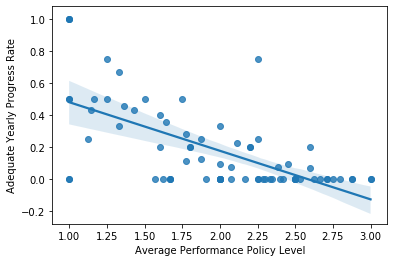

In [35]:
ax = sns.regplot(x='Average Performance Policy Level',y='Adequate Yearly Progress Rate', data=cps_perf)

In [29]:
regr = linear_model.LinearRegression()
x = np.asanyarray(cps_perf[['Average Performance Policy Level']])
y = np.asanyarray(cps_perf[['Adequate Yearly Progress Rate']])
regr.fit(x,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Text(0, 0.5, 'Adequate Yearly Progress Rate')

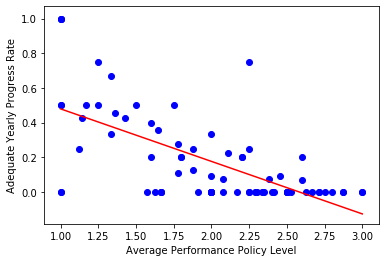

In [30]:
plt.scatter(cps_perf['Average Performance Policy Level'],cps_perf['Adequate Yearly Progress Rate'],color='blue')
plt.plot(x, regr.coef_[0][0]*x + regr.intercept_[0], '-r')
plt.xlabel('Average Performance Policy Level')
plt.ylabel('Adequate Yearly Progress Rate')

In [33]:
yhat = regr.predict(x)
r2 = r2_score(yhat, y)
print(r2)

-0.38337088157972876


In [36]:
cps_perf.reset_index(inplace=True)
cps_perf.shape

(77, 4)

We can observe that as the Average Performance Policy Level increases (the assessed school quality is poorer) the Adequate Yearly Progress Rate decreases. This indicates that these two variables are inversely proportional.

### <center> Latitude and Longitude Values for Community Areas in Chicago <center>

Let's use geopy to get latitude/longitude values for the community areas in Chicago.

In [38]:
geolocator = Nominatim(user_agent='chi_explorer')

In [39]:
lats = []
lngs = []

for ind,address in enumerate(school_ca['community_area_name']):
    chi_address = '{}, CHICAGO, IL'.format(address)
    location = geolocator.geocode(chi_address)
    lats.append(location.latitude)
    lngs.append(location.longitude)
    #print(chi_address)

#DO NOT UNCOMMENT AND RE-RUN, SOME LATITUDE AND LONGITUDE VALUES ARE INCORRECT AND WERE MANUALLY ADDED
#RUNNING WILL OVERWRITE
#school_ca['Latitude'] = lats
#school_ca['Longitude']=lngs

In [37]:
# ensure the indices match for performing the merge
school_ca.set_index('community_area_name');
cps_perf.set_index('community_area_name');

In [38]:
chi_ca = cps_perf.merge(school_ca)

Check the shape to ensure there are still 77 community areas covered

In [103]:
chi_ca.shape

(77, 7)

Now that each community area has its associated latitude and longitude values, let's reorder the columns to place the community area number at the beginning of the dataframe.

In [ ]:
# get the column names
newcols=chi_ca.columns.tolist()

# reoder the columns
chi_ca=chi_ca[[newcols[4]] + newcols[:4] + newcols[5:]]

# sort in order of the community areas and rename the community area to 'ca'
chi_ca.sort_values('community_area_number',ascending=True,inplace=True);
chi_ca=chi_ca.reset_index(drop=True)
chi_ca=chi_ca.rename(columns={'community_area_number':'ca'})
chi_ca

## <center> 2. Socioeconomic Indicator Data <center>

Now let's import the socioeconomic indicator data, drop the last row (extraneous data) and cast the community area number to an int so it can be used more readily for indexing.

In [34]:
df_soc = pd.read_json("https://data.cityofchicago.org/resource/kn9c-c2s2.json")

#drop extraneous data
df_soc.drop(77, axis=0,inplace=True)

#cast community area
df_soc['ca']=df_soc['ca'].astype(int)

Uppercase all of the community area names in the case that we need to join on them, so they match the other dataframes.

In [35]:
ca_upper = []
[ca_upper.append(a.upper()) for a in list(df_soc['community_area_name'])]
df_soc['community_area_name'] = ca_upper

Check that there are 77 rows, one for each community area.

In [36]:
df_soc.shape

(77, 9)

Since the previous City of Chicago data does not use an apostrophe in O'Hare, let's make it a convention that there is no apostrophe and make all instances of the name consistent.

In [37]:
df_soc.iloc[75,1]='OHARE'

In [38]:
df_soc

,ca,community_area_name,percent_of_housing_crowded,percent_households_below_poverty,percent_aged_16_unemployed,percent_aged_25_without_high_school_diploma,percent_aged_under_18_or_over_64,per_capita_income_,hardship_index
0,1,ROGERS PARK,7.7,23.6,8.7,18.2,27.5,23939,39.0
1,2,WEST RIDGE,7.8,17.2,8.8,20.8,38.5,23040,46.0
2,3,UPTOWN,3.8,24.0,8.9,11.8,22.2,35787,20.0
3,4,LINCOLN SQUARE,3.4,10.9,8.2,13.4,25.5,37524,17.0
4,5,NORTH CENTER,0.3,7.5,5.2,4.5,26.2,57123,6.0
5,6,LAKE VIEW,1.1,11.4,4.7,2.6,17.0,60058,5.0
6,7,LINCOLN PARK,0.8,12.3,5.1,3.6,21.5,71551,2.0
7,8,NEAR NORTH SIDE,1.9,12.9,7.0,2.5,22.6,88669,1.0
8,9,EDISON PARK,1.1,3.3,6.5,7.4,35.3,40959,8.0
9,10,NORWOOD PARK,2.0,5.4,9.0,11.5,39.5,32875,21.0


In [97]:
cols = df_soc.columns.values[2:7]

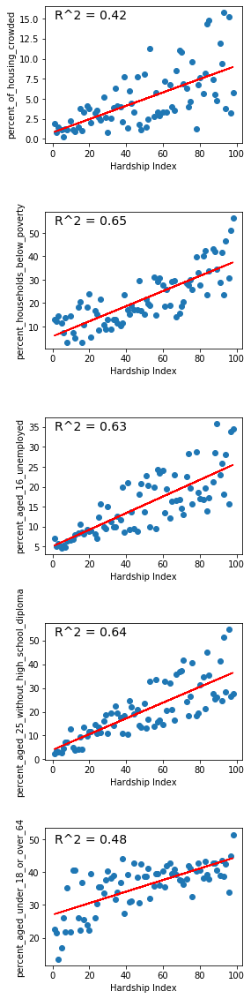

In [147]:
a = df_soc[['hardship_index']]
fig = plt.figure()
fig.set_size_inches(4,20)

for i in np.arange(0,len(cols)):
    b = df_soc[[cols[i]]]

    a = np.asanyarray(a)
    b = np.asanyarray(b)

    lm1 = linear_model.LinearRegression().fit(a,b)
    
    plt.subplot(5,1,i+1)
    plt.scatter(a,b)
    plt.plot(a, lm1.coef_[0][0]*a + lm1.intercept_[0], '-r')
    plt.ylabel(cols[i])
    plt.text(1,0.95*max(b),'R^2 = {:.2f}'.format(lm1.score(a,b)),fontsize=14)
    plt.xlabel('Hardship Index')

plt.subplots_adjust(hspace=0.5)

Now that we have the socioeconomic data, let's join the CPS performance data with the socioeconomic data.

In [ ]:
# merge the school data with the socioeconomic data
CHICAGO_FULL = chi_ca.merge(df_soc,on='ca')

# drop one community area name, since both are the same
CHICAGO_FULL=CHICAGO_FULL.drop(columns=['community_area_name_y'])

# rename the column of the left dataframe
CHICAGO_FULL=CHICAGO_FULL.rename(columns={'community_area_name_x':'community_area_name'})
CHICAGO_FULL

## <center> 3. Rent/Housing Price Data <center>

#### <center> Prepare Data for Use with Quandl <center>

Now we will use the Quandl API to get Housing Data for each of the community areas. First, let's get the postal code and the county for each of the community areas.

In [138]:
df = CHICAGO_FULL[['Latitude','Longitude']]
df.shape

(77, 2)

Let's use one of the earlier Labs to define the function to get the zipcodes for each community area using geopy.

In [141]:
def get_zipcode(df, geolocator, lat_field, lon_field):
    location = geolocator.reverse((df[lat_field], df[lon_field]))
    return location.raw['address']['postcode']

import geopy
geolocator = geopy.Nominatim(user_agent='chi-explorer')

zipcodes = df.apply(get_zipcode, axis=1, geolocator=geolocator, lat_field='Latitude', lon_field='Longitude')
zipcodes.shape

(77,)

Insert the obtained zipcodes into the dataframe.

In [ ]:
CHICAGO_FULL.insert(7,'Postal Code',zipcodes)

Some of these values exceed our normal 5-digit postal code scheme for ZIP codes and some are also erroneous values, so these will be inserted into the CHICAGO_FULL dataframe.

In [148]:
CHICAGO_FULL['Postal Code'] = [val[0:5] for ind,val in enumerate(CHICAGO_FULL['Postal Code'])]
CHICAGO_FULL.iloc[3,7]='60625'
CHICAGO_FULL.iloc[37,7]='60615'

In [149]:
CHICAGO_FULL.shape

(77, 15)

Let's drop the "Percent of Housing Crowded" and "Percent aged under 18 or over 64" metrics because those are less relevant to the analysis.

In [152]:
CHICAGO_FULL=CHICAGO_FULL.drop(columns=['percent_aged_under_18_or_over_64','percent_of_housing_crowded'])

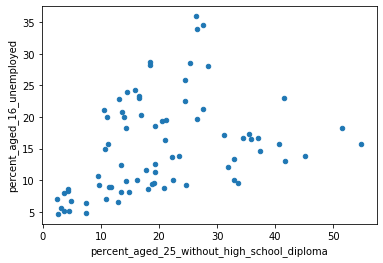

In [153]:
CHICAGO_FULL.plot(kind='scatter',y='percent_aged_16_unemployed',x='percent_aged_25_without_high_school_diploma')

Now let's save the CHICAGO_FULL dataframe to the csv file.

In [361]:
CHICAGO_FULL
CHICAGO_FULL.to_csv('CHICAGO_FULL.csv')

,ca,community_area_name,Average Performance Policy Level,Number of Schools Reporting,Adequate Yearly Progress Rate,Latitude,Longitude,Postal Code,percent_households_below_poverty,percent_aged_16_unemployed,percent_aged_25_without_high_school_diploma,per_capita_income_,hardship_index
0,1,ROGERS PARK,2.333333,6,0.000000,42.010531,-87.670748,60645,23.6,8.7,18.2,23939,39.0
1,2,WEST RIDGE,1.125000,8,0.250000,42.003548,-87.696243,60645,17.2,8.8,20.8,23040,46.0
2,3,UPTOWN,1.571429,7,0.000000,41.966630,-87.655546,60640,24.0,8.9,11.8,35787,20.0
3,4,LINCOLN SQUARE,1.800000,5,0.200000,41.975990,-87.689616,60625,10.9,8.2,13.4,37524,17.0
4,5,NORTH CENTER,1.166667,6,0.500000,41.956107,-87.679160,60618,7.5,5.2,4.5,57123,6.0
5,6,LAKE VIEW,1.363636,11,0.454545,41.947050,-87.655429,60657,11.4,4.7,2.6,60058,5.0
6,7,LINCOLN PARK,1.428571,7,0.428571,41.940298,-87.638117,60657,12.3,5.1,3.6,71551,2.0
7,8,NEAR NORTH SIDE,2.000000,6,0.333333,41.900033,-87.634497,60610,12.9,7.0,2.5,88669,1.0
8,9,EDISON PARK,1.000000,1,1.000000,42.005733,-87.814016,60631,3.3,6.5,7.4,40959,8.0
9,10,NORWOOD PARK,1.142857,7,0.428571,41.985590,-87.800582,60631,5.4,9.0,11.5,32875,21.0


In [51]:
CHICAGO_FULL = pd.read_csv('CHICAGO_FULL.csv')
CHICAGO_FULL.drop(columns=['Unnamed: 0'],inplace=True)

#### <center> Extract Neighborhood Codes from Quandl Website <center>

Now let's use Quandl API with the postal code information to get rent prices for each community area. Let's read in from our csv files and formulate the quandl api calls.

In [52]:
# read in the neighborhood codes
N_CODES = pd.read_csv('https://s3.amazonaws.com/quandl-production-static/zillow/neighborhood.txt',skiprows=1,
                      header=0,names=['Location','City','County','Code'])

N_CODES.dropna(axis=0,inplace=True) # drop nan values

N_CODES['City']=N_CODES['City'].str.strip() # remove the leading and trailing whitespace
N_CODES = N_CODES[N_CODES['City']=='Chicago'] # select only the neighborhood codes corresponding to Chicago
N_CODES['County']=N_CODES['County'].str.strip() # remove leading and trailing whitespace from County values
N_CODES['Location']=N_CODES['Location'].str.strip() # remove leading and trailing whitespace from Location values

N_CODES=N_CODES[N_CODES['County']!='Cook'] #there are some duplicate values, we'll use the ones that say "Cook County"

N_CODES = N_CODES.drop(columns=['City','County']) #drop the city and county columns, since everything is in Cook, Chicago

In [53]:
# Isolate the Codes, which are tied to another value
N_CODES['Code']=[i.split("|")[1] for i in N_CODES['Code']]

# Convert all the neighborhoods to uppercase to match with other data
N_CODES['Location']=[i.upper() for i in list(N_CODES['Location'])]

N_CODES=N_CODES.reset_index(drop=True)

The following codes rename neighborhood values that are synonymous between the two datasets to ensure that the Quandl neighborhood codes correspond with the correct community areas.

In [141]:
N_CODES.iloc[116,0]='NEAR NORTH SIDE'
N_CODES.iloc[128,0]='OHARE'

In [146]:
N_CODES.iloc[182,0]='LOOP'
N_CODES.drop(columns=0,inplace=True)

In [152]:
N_CODES.iloc[69,0]='AUBURN GRESHAM'

In [156]:
N_CODES.iloc[36,0]='BELMONT CRAGIN'

In [160]:
N_CODES.iloc[180,0]='DOUGLAS'

In [164]:
N_CODES.iloc[205,0]='WEST RIDGE'

In [168]:
N_CODES.iloc[132,0]='NORWOOD PARK'

In [172]:
N_CODES.iloc[167,0]='AUSTIN'

In [176]:
N_CODES.iloc[78,0]='NORTH LAWNDALE'

In [180]:
N_CODES.iloc[38,0]='SOUTH LAWNDALE'

In [186]:
N_CODES.iloc[141,0]='LOWER WEST SIDE'

In [190]:
N_CODES.iloc[172,0]='NEAR SOUTH SIDE'

In [194]:
N_CODES.iloc[32,0]='ARMOUR SQUARE'

In [198]:
N_CODES.iloc[21,0]='GRAND BOULEVARD'

In [202]:
N_CODES.iloc[8,0]='NEW CITY'

In [206]:
N_CODES.iloc[67,0]='GREATER GRAND CROSSING'

Merge the community area information with the neighborhood codes and save to csv for later retrieval.

In [208]:
#merge reference table with the neighborhood codes
CA_NCODES=pd.merge(CA_REF_TABLE, N_CODES.rename(columns={'Location':'ca_name'}), how='left').sort_values('Code')

#save to csv
CA_NCODES.to_csv('N_CODES.csv')

In [ ]:
CA_NCODES=pd.read_csv('N_CODES.csv')
CA_NCODES=CA_NCODES.drop(columns='Unnamed: 0')
CA_NCODES=CA_NCODES.sort_values('ca')

In [4]:
CA_NCODES

,ca,ca_name,Code
6,1,ROGERS PARK,10446
1,2,WEST RIDGE,10391
26,3,UPTOWN,10755
62,4,LINCOLN SQUARE,12823
29,5,NORTH CENTER,10797
4,6,LAKE VIEW,10440
40,7,LINCOLN PARK,11021
27,8,NEAR NORTH SIDE,10760
45,9,EDISON PARK,11187
66,10,NORWOOD PARK,14866


Now let's create a dictionary to store the rent for each community area once we obtain it from Quandl.

In [8]:
rent={}

This script will collect the rent values from Quandl and print those that could not be found.

In [10]:
for i in np.arange(0,CA_NCODES.shape[0]):
    try:
        r = list(quandl.get('ZILLOW/N{}_MRPAH'.format(CA_NCODES.iloc[i,2]))['Value'])[-1]
        print("Found! Median Rent in {} is {}".format(CA_NCODES.iloc[i,1],r))
        rent[CA_NCODES.iloc[i,1]]=r
    except:
        print("Median Rent in {}, ({}) could not be found".format(CA_NCODES.iloc[i,1],CA_NCODES.iloc[i,2]))
        rent[CA_NCODES.iloc[i,1]]=None

Found! Median Rent in ROGERS PARK is 1350.0
Found! Median Rent in WEST RIDGE is 1250.0
Found! Median Rent in UPTOWN is 1425.0
Median Rent in LINCOLN SQUARE, (12823) could not be found
Median Rent in NORTH CENTER, (10797) could not be found
Found! Median Rent in LAKE VIEW is 1900.0
Found! Median Rent in LINCOLN PARK is 1800.0
Found! Median Rent in NEAR NORTH SIDE is 1900.0
Median Rent in EDISON PARK, (11187) could not be found
Median Rent in NORWOOD PARK, (14866) could not be found
Median Rent in JEFFERSON PARK, (10491) could not be found
Median Rent in FOREST GLEN, (17367) could not be found
Median Rent in NORTH PARK, (12795) could not be found
Found! Median Rent in ALBANY PARK is 1395.0
Median Rent in PORTAGE PARK, (10498) could not be found
Median Rent in IRVING PARK, (11879) could not be found
Median Rent in DUNNING, (13586) could not be found
Median Rent in MONTCLARE, (10974) could not be found
Median Rent in BELMONT CRAGIN, (10550) could not be found
Median Rent in HERMOSA, (12996

Convert the rent dictionary to a dataframe.

In [30]:
df_rent = pd.DataFrame(list(rent.items()))
df_rent

,0,1
0,ROGERS PARK,1350.0
1,WEST RIDGE,1250.0
2,UPTOWN,1425.0
3,LINCOLN SQUARE,NaN
4,NORTH CENTER,NaN
5,LAKE VIEW,1900.0
6,LINCOLN PARK,1800.0
7,NEAR NORTH SIDE,1900.0
8,EDISON PARK,NaN
9,NORWOOD PARK,NaN


Let's rename the columns to correspond with the data they actually represent.

In [51]:
df_rent.rename(columns={'ca':'community_area_name',1:'Median Rent'},inplace=True)
CA_REF=CHICAGO_FULL[['ca','community_area_name']]
df_rent = CA_REF.merge(df_rent)

In [67]:
df_rent

,ca,community_area_name,Median Rent
0,1,ROGERS PARK,1350.0
1,2,WEST RIDGE,1250.0
2,3,UPTOWN,1425.0
3,4,LINCOLN SQUARE,NaN
4,5,NORTH CENTER,NaN
5,6,LAKE VIEW,1900.0
6,7,LINCOLN PARK,1800.0
7,8,NEAR NORTH SIDE,1900.0
8,9,EDISON PARK,NaN
9,10,NORWOOD PARK,NaN


Since there were serveral NaN values returned using the neighborhhood codes, let's try to fill in the remaining rent prices using the zipcodes.

In [91]:
for i in np.arange(0,df_rent.shape[0]):
    if math.isnan(df_rent.iloc[i,2]):
        try:
            r= list(quandl.get('ZILLOW/Z{}_MRP1B'.format(CHICAGO_FULL['Postal Code'][i]))['Value'])[-1]
            print('Rent for {} is {}'.format(df_rent.iloc[i,1],r))
            df_rent.iloc[i,2] = r
        except:
            print("Rent not found for {}".format(df_rent.iloc[i,1]))


Rent not found for EDISON PARK
Rent not found for NORWOOD PARK
Rent not found for FOREST GLEN
Rent not found for KENWOOD
Rent not found for HEGEWISCH
Rent not found for GARFIELD RIDGE
Rent not found for BRIGHTON PARK
Rent not found for WEST ELSDON
Rent not found for CLEARING
Rent not found for WEST LAWN
Rent not found for ASHBURN
Rent not found for MOUNT GREENWOOD
Rent not found for OHARE


Since there are still remaining NaN values, we will replace them with the median rent price of all homes in Chicago.

In [93]:
# gets the value of the median rent in the city of chicago
mrpah_chicago = list(quandl.get('ZILLOW/C19469_MRPAH')['Value'])[-1]

# fills the NaN values in the dataframe with the median rent of the city of chicago
df_rent['Median Rent'].fillna(mrpah_chicago,inplace=True)

# merges the rent dataframe with the CHICAGO_FULL dataframe, adding the housing data
CHICAGO_FULL = CHICAGO_FULL.merge(df_rent)

Let's save the CHICAGO_FULL dataframe to the csv so that we can recover this data easily.

In [102]:
CHICAGO_FULL.to_csv('CHICAGO_FULL.csv')

In [54]:
CHICAGO = pd.read_csv('CHICAGO_FULL.csv')
CHICAGO.drop(columns=['Unnamed: 0'],inplace=True)

By plotting and using linear regression, we can see that percent_households_below_poverty, percent_aged_16_unemployed, percent_aged_25_without_high_school_diploma, and hardship_index are all related in the same way. Since hardship_index accounts for these factors and is also already normalized, let's drop the other three and use the hardship index.

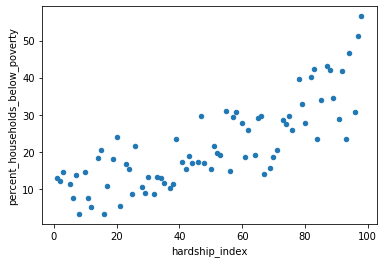

In [55]:
CHICAGO.plot(kind='scatter',x='hardship_index',y='percent_households_below_poverty')

In [56]:
CHICAGO.drop(columns=['percent_households_below_poverty','percent_aged_16_unemployed','percent_aged_25_without_high_school_diploma'],inplace=True)

In [57]:
CHICAGO

,ca,community_area_name,Average Performance Policy Level,Number of Schools Reporting,Adequate Yearly Progress Rate,Latitude,Longitude,Postal Code,per_capita_income_,hardship_index,Median Rent
0,1,ROGERS PARK,2.333333,6,0.000000,42.010531,-87.670748,60645,23939,39.0,1350.0
1,2,WEST RIDGE,1.125000,8,0.250000,42.003548,-87.696243,60645,23040,46.0,1250.0
2,3,UPTOWN,1.571429,7,0.000000,41.966630,-87.655546,60640,35787,20.0,1425.0
3,4,LINCOLN SQUARE,1.800000,5,0.200000,41.975990,-87.689616,60625,37524,17.0,1395.0
4,5,NORTH CENTER,1.166667,6,0.500000,41.956107,-87.679160,60618,57123,6.0,1925.0
5,6,LAKE VIEW,1.363636,11,0.454545,41.947050,-87.655429,60657,60058,5.0,1900.0
6,7,LINCOLN PARK,1.428571,7,0.428571,41.940298,-87.638117,60657,71551,2.0,1800.0
7,8,NEAR NORTH SIDE,2.000000,6,0.333333,41.900033,-87.634497,60610,88669,1.0,1900.0
8,9,EDISON PARK,1.000000,1,1.000000,42.005734,-87.814016,60631,40959,8.0,1750.0
9,10,NORWOOD PARK,1.142857,7,0.428571,41.985590,-87.800582,60631,32875,21.0,1750.0


## <center> 4. Crime Data <center>

Now let's read in the crime data and display it.

In [58]:
crimes = pd.read_csv('Crimes_-_2020.csv')
crimes.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,12084255,JD271508,06/21/2020 04:15:00 PM,050XX S CORNELL AVE,031A,ROBBERY,ARMED - HANDGUN,GAS STATION,False,False,222,2,5.0,39,03,1187887.0,1871709.0,2020,06/28/2020 03:47:32 PM,41.803057,-87.586453,"(41.803056534, -87.586453094)"
1,12083825,JD271026,06/21/2020 02:12:00 AM,006XX E 44TH ST,041A,BATTERY,AGGRAVATED - HANDGUN,OTHER (SPECIFY),False,False,221,2,4.0,38,04B,1181468.0,1875986.0,2020,06/28/2020 03:47:32 PM,41.814944,-87.609862,"(41.814943616, -87.609862202)"
2,12083898,JD271075,06/21/2020 03:46:00 AM,001XX E 95TH ST,1310,CRIMINAL DAMAGE,TO PROPERTY,OTHER (SPECIFY),False,False,634,6,9.0,49,14,1178956.0,1842018.0,2020,06/28/2020 03:47:32 PM,41.721789,-87.620110,"(41.721789488, -87.620109702)"
3,12084166,JD271377,06/21/2020 01:26:00 PM,075XX N SEELEY AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,False,True,2424,24,49.0,1,08B,1161338.0,1949989.0,2020,06/28/2020 03:47:32 PM,42.018454,-87.681639,"(42.018454423, -87.681639143)"
4,12088654,JD276641,02/05/2020 08:00:00 AM,066XX N LAKEWOOD AVE,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,APARTMENT,False,False,2432,24,49.0,1,11,1166340.0,1944321.0,2020,06/28/2020 03:45:35 PM,42.002795,-87.663396,"(42.002795364, -87.663395916)"


Extract the Community area and year of each crime. Since we only care about total crimes in each community area, we can group the crimes by community area and count them.

In [61]:
ca_crime = crimes[['Community Area','Year']]

numcrimes = ca_crime.groupby('Community Area').count().rename(columns={'Year':'Number of Crimes 2001-present'})

numcrimes.reset_index(inplace=True)
numcrimes.rename(columns={'Community Area':'ca'},inplace=True)
numcrimes

,ca,Number of Crimes 2001-present
0,1,1471
1,2,1266
2,3,1257
3,4,792
4,5,512
5,6,1895
6,7,1280
7,8,3379
8,9,96
9,10,350


Merge the Crime data with the CHICAGO dataframe to round out the non-Foursquare data.

In [62]:
CHICAGO = CHICAGO.merge(numcrimes)
CHICAGO.to_csv('CHICAGO.csv')

## <center> 5. Foursquare Data <center>

Now, let's use Foursquare to find out the top 5 venues in proximity to each community area location.

#### Define Foursquare Credentials and Version

In [104]:
CLIENT_ID = 'RMGLSZNSF0E2O4ZDM2RUE54HPXOYLX105EHCSIOAZYKGINFM' # your Foursquare ID
CLIENT_SECRET = 'NK1W0BWWHDOEO4Q1XG5KNCK2PUIDNEFKINVYV1SCU42FHIY1' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

In [105]:
LIMIT = 100;
radius= 1200;
url = "https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},\
{}&radius={}&limit={}".format(
    CLIENT_ID,
    CLIENT_SECRET,
    VERSION,
    CHICAGO.iloc[53,5],
    CHICAGO.iloc[53,6],
    radius,
    LIMIT)

In [106]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

####  Let's create a function to repeat this for all neighborhoods

In [108]:
def getNearbyVenues(names, latitudes, longitudes, radius=1200, LIMIT=100):
    
    i = 1;
    print(radius, LIMIT)
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print("{} {}".format(i,name))
        i = i+1
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
        except:
            print(requests.get(url).json()['response'])
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [109]:
chicago_venues = getNearbyVenues(names=CHICAGO['community_area_name'],
                                latitudes = CHICAGO['Latitude'],
                                longitudes= CHICAGO['Longitude'])

1200 100
1 ROGERS PARK
2 WEST RIDGE
3 UPTOWN
4 LINCOLN SQUARE
5 NORTH CENTER
6 LAKE VIEW
7 LINCOLN PARK
8 NEAR NORTH SIDE
9 EDISON PARK
10 NORWOOD PARK
11 JEFFERSON PARK
12 FOREST GLEN
13 NORTH PARK
14 ALBANY PARK
15 PORTAGE PARK
16 IRVING PARK
17 DUNNING
18 MONTCLARE
19 BELMONT CRAGIN
20 HERMOSA
21 AVONDALE
22 LOGAN SQUARE
23 HUMBOLDT PARK
24 WEST TOWN
25 AUSTIN
26 WEST GARFIELD PARK
27 EAST GARFIELD PARK
28 NEAR WEST SIDE
29 NORTH LAWNDALE
30 SOUTH LAWNDALE
31 LOWER WEST SIDE
32 LOOP
33 NEAR SOUTH SIDE
34 ARMOUR SQUARE
35 DOUGLAS
36 OAKLAND
37 FULLER PARK
38 GRAND BOULEVARD
39 KENWOOD
40 WASHINGTON PARK
41 HYDE PARK
42 WOODLAWN
43 SOUTH SHORE
44 CHATHAM
45 AVALON PARK
46 SOUTH CHICAGO
47 BURNSIDE
48 CALUMET HEIGHTS
49 ROSELAND
50 PULLMAN
51 SOUTH DEERING
52 EAST SIDE
53 WEST PULLMAN
54 RIVERDALE
55 HEGEWISCH
56 GARFIELD RIDGE
57 ARCHER HEIGHTS
58 BRIGHTON PARK
59 MCKINLEY PARK
60 BRIDGEPORT
61 NEW CITY
62 WEST ELSDON
63 GAGE PARK
64 CLEARING
65 WEST LAWN
66 CHICAGO LAWN
67 WEST ENGLE

In [110]:
pd.concat([CHICAGO[['community_area_name']],pd.DataFrame(chicago_venues['Neighborhood'].unique())],axis=1)

,community_area_name,0
0,ROGERS PARK,ROGERS PARK
1,WEST RIDGE,WEST RIDGE
2,UPTOWN,UPTOWN
3,LINCOLN SQUARE,LINCOLN SQUARE
4,NORTH CENTER,NORTH CENTER
5,LAKE VIEW,LAKE VIEW
6,LINCOLN PARK,LINCOLN PARK
7,NEAR NORTH SIDE,NEAR NORTH SIDE
8,EDISON PARK,EDISON PARK
9,NORWOOD PARK,NORWOOD PARK


In [111]:
chicago_venues.shape

(4726, 7)

#### Let's check the number of venues returned for each neighborhood

In [112]:
chicago_venues.groupby("Neighborhood").count().shape

(77, 6)

#### Let's find how many unique categories can be curated from all returned venues

In [113]:
print('There are {} unique categories.'.format(len(chicago_venues['Venue Category'].unique())))

There are 355 unique categories.


### Analyze each neighborhood

In [114]:
# one hot encoding
chi_onehot = pd.get_dummies(chicago_venues[['Venue Category']],prefix='',prefix_sep='')

# add neighborhood column back to dataframe
chi_onehot['Neighborhood'] = chicago_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [chi_onehot.columns[-1]] + list(chi_onehot.columns[:-1])
chi_onehot = chi_onehot[fixed_columns]

chi_onehot.head()

,Yoga Studio,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Casino,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Bookstore,College Cafeteria,College Quad,College Rec Center,College Stadium,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool Hall,Pop-Up Shop,Portuguese Restaurant,Post Office,Pub,Public Art,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recycling Facility,Rental Car Location,Restaurant,Rock Club,Roof Deck,Russian

In [115]:
chi_onehot.shape

(4726, 355)

In [116]:
chicago_grouped = chi_onehot.groupby("Neighborhood").mean().reset_index()
chicago_grouped

,Neighborhood,Yoga Studio,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Casino,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Bookstore,College Cafeteria,College Quad,College Rec Center,College Stadium,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool Hall,Pop-Up Shop,Portuguese Restaurant,Post Office,Pub,Public Art,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recycling Facility,Rental Car Location,Restaurant,Rock Club,Roof Deck,Russian

In [117]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [118]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = chicago_grouped['Neighborhood']

for ind in np.arange(chicago_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(chicago_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALBANY PARK,Coffee Shop,Sandwich Place,Mexican Restaurant,Chinese Restaurant,Park,Grocery Store,Bakery,Pizza Place,Bus Station,Middle Eastern Restaurant
1,ARCHER HEIGHTS,Mexican Restaurant,Mobile Phone Shop,Clothing Store,Grocery Store,Seafood Restaurant,Sandwich Place,Bank,Fast Food Restaurant,Rental Car Location,Nightclub
2,ARMOUR SQUARE,Chinese Restaurant,Pizza Place,Baseball Stadium,Grocery Store,Bar,Bus Station,Restaurant,Shipping Store,Coffee Shop,Gym / Fitness Center
3,ASHBURN,Fast Food Restaurant,Mexican Restaurant,Italian Restaurant,Food,Sports Bar,Seafood Restaurant,Locksmith,Sandwich Place,Furniture / Home Store,Bar
4,AUBURN GRESHAM,Fast Food Restaurant,American Restaurant,Pharmacy,Park,Pizza Place,Discount Store,Lounge,Gas Station,Southern / Soul Food Restaurant,Mexican Restaurant
5,AUSTIN,Fried Chicken Joint,Grocery Store,Sandwich Place,Seafood Restaurant,Mexican Restaurant,Fast Food Restaurant,BBQ Joint,Rental Car Location,Discount Store,Train Station
6,AVALON PARK,Fast Food Restaurant,Park,Pharmacy,Athletics & Sports,Diner,Hot Dog Joint,Discount Store,Grocery Store,Sandwich Place,Pizza Place
7,AVONDALE,Bar,Coffee Shop,Mexican Restaurant,Grocery Store,Café,Chinese Restaurant,Italian Restaurant,Korean Restaurant,Brewery,Sandwich Place
8,BELMONT CRAGIN,Mexican Restaurant,Pharmacy,Sandwich Place,American Restaurant,Nightclub,Discount Store,Donut Shop,Currency Exchange,Athletics & Sports,Chinese Restaurant
9,BEVERLY,Cosmetics Shop,Pizza Place,Discount Store,Sandwich Place,Fast Food Restaurant,Department Store,Mobile Phone Shop,Park,Donut Shop,Bakery


In [119]:
chi_top5_venues = neighborhoods_venues_sorted.iloc[:,0:6].rename(columns={'Neighborhood':'community_area_name'})

In [121]:
CHICAGO = CHICAGO.merge(chi_top5_venues)
CHICAGO

,ca,community_area_name,Average Performance Policy Level,Latitude,Longitude,per_capita_income_,hardship_index,Median Rent,Crime Rate,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,1,ROGERS PARK,2.333333,42.010531,-87.670748,23939,39.0,1350.0,0.026715,Beach,Mexican Restaurant,Sandwich Place,Park,Fast Food Restaurant
1,2,WEST RIDGE,1.125000,42.003548,-87.696243,23040,46.0,1250.0,0.016611,Indian Restaurant,Pakistani Restaurant,Grocery Store,Pizza Place,Convenience Store
2,3,UPTOWN,1.571429,41.966630,-87.655546,35787,20.0,1425.0,0.021683,Vietnamese Restaurant,Coffee Shop,Chinese Restaurant,Bar,Grocery Store
3,4,LINCOLN SQUARE,1.800000,41.975990,-87.689616,37524,17.0,1395.0,0.018986,Bar,Gym,Sandwich Place,Thai Restaurant,Coffee Shop
4,5,NORTH CENTER,1.166667,41.956107,-87.679160,57123,6.0,1925.0,0.014306,Bar,Pizza Place,Coffee Shop,Brewery,Restaurant
5,6,LAKE VIEW,1.363636,41.947050,-87.655429,60058,5.0,1900.0,0.018861,Pizza Place,Gay Bar,Bar,Sports Bar,Italian Restaurant
6,7,LINCOLN PARK,1.428571,41.940298,-87.638117,71551,2.0,1800.0,0.018904,Mexican Restaurant,Italian Restaurant,Grocery Store,Sushi Restaurant,Bar
7,8,NEAR NORTH SIDE,2.000000,41.900033,-87.634497,88669,1.0,1900.0,0.038012,Coffee Shop,Hotel,Italian Restaurant,Steakhouse,Gym / Fitness Center
8,9,EDISON PARK,1.000000,42.005734,-87.814016,40959,8.0,1750.0,0.008272,Park,Bar,Italian Restaurant,Pizza Place,Sandwich Place
9,10,NORWOOD PARK,1.142857,41.985590,-87.800582,32875,21.0,1750.0,0.009437,American Restaurant,Pizza Place,Park,Bar,Irish Pub


In [122]:
CHICAGO.to_csv('CHICAGO_SUMMARY.csv')

In [152]:
CHICAGO_SUMMARY = pd.read_csv('CHICAGO_SUMMARY.csv')
CHICAGO_SUMMARY.drop(columns='Unnamed: 0',inplace=True)
CHICAGO_SUMMARY

,ca,community_area_name,Average Performance Policy Level,Latitude,Longitude,per_capita_income_,hardship_index,Median Rent,Crime Rate,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,1,ROGERS PARK,2.333333,42.010531,-87.670748,23939,39.0,1350.0,0.026715,Beach,Mexican Restaurant,Sandwich Place,Park,Fast Food Restaurant
1,2,WEST RIDGE,1.125000,42.003548,-87.696243,23040,46.0,1250.0,0.016611,Indian Restaurant,Pakistani Restaurant,Grocery Store,Pizza Place,Convenience Store
2,3,UPTOWN,1.571429,41.966630,-87.655546,35787,20.0,1425.0,0.021683,Vietnamese Restaurant,Coffee Shop,Chinese Restaurant,Bar,Grocery Store
3,4,LINCOLN SQUARE,1.800000,41.975990,-87.689616,37524,17.0,1395.0,0.018986,Bar,Gym,Sandwich Place,Thai Restaurant,Coffee Shop
4,5,NORTH CENTER,1.166667,41.956107,-87.679160,57123,6.0,1925.0,0.014306,Bar,Pizza Place,Coffee Shop,Brewery,Restaurant
5,6,LAKE VIEW,1.363636,41.947050,-87.655429,60058,5.0,1900.0,0.018861,Pizza Place,Gay Bar,Bar,Sports Bar,Italian Restaurant
6,7,LINCOLN PARK,1.428571,41.940298,-87.638117,71551,2.0,1800.0,0.018904,Mexican Restaurant,Italian Restaurant,Grocery Store,Sushi Restaurant,Bar
7,8,NEAR NORTH SIDE,2.000000,41.900033,-87.634497,88669,1.0,1900.0,0.038012,Coffee Shop,Hotel,Italian Restaurant,Steakhouse,Gym / Fitness Center
8,9,EDISON PARK,1.000000,42.005734,-87.814016,40959,8.0,1750.0,0.008272,Park,Bar,Italian Restaurant,Pizza Place,Sandwich Place
9,10,NORWOOD PARK,1.142857,41.985590,-87.800582,32875,21.0,1750.0,0.009437,American Restaurant,Pizza Place,Park,Bar,Irish Pub


## <center> 6. Chicago Census Data - Crime Rate <center>

Let's add in the census population information so we can turn the crime number into a crime rate.

In [153]:
cen = pd.read_csv('CHICAGO_CENSUS.csv');

#select only the neighborhood and total population columns 
cen = cen[['GEOG','TOT_POP']]

# convert the neighborhoods to uppercase
cen[['GEOG']] = [i.upper() for i in list(cen['GEOG'])]

# replace the following neighborhood names for consistency
cen.iloc[55,0]='OHARE'
cen.iloc[65,0]='LOOP'
cen

,GEOG,TOT_POP
0,ALBANY PARK,51992
1,ARCHER HEIGHTS,13142
2,ARMOUR SQUARE,13455
3,ASHBURN,43792
4,AUBURN GRESHAM,46278
5,AUSTIN,95260
6,AVALON PARK,9985
7,AVONDALE,37368
8,BELMONT CRAGIN,79910
9,BEVERLY,20822


In [154]:
CHICAGO_SUMMARY = CHICAGO_SUMMARY.merge(cen.rename(columns={'GEOG':'community_area_name'}))

Divide the number of crimes by the population to find the average crime rate for the past 20 years in each community area in Chicago.

In [165]:
#CHICAGO_SUMMARY['Crime Rate'] = CHICAGO_SUMMARY['Number of Crimes 2001-present']/CHICAGO_SUMMARY['TOT_POP']
pre_clustering_data = CHICAGO_SUMMARY.iloc[:,0:9].drop(columns=['community_area_name','Latitude','Longitude'])
pre_clustering_data.to_csv('pre_clustering_data.csv')

In [5]:
pre_clustering_data = pd.read_csv('pre_clustering_data.csv')
pre_clustering_data.drop(columns='Unnamed: 0',inplace=True)
pre_clustering_data

,ca,Average Performance Policy Level,per_capita_income_,hardship_index,Median Rent,Crime Rate
0,1,2.333333,23939,39.0,1350.0,0.026715
1,2,1.125000,23040,46.0,1250.0,0.016611
2,3,1.571429,35787,20.0,1425.0,0.021683
3,4,1.800000,37524,17.0,1395.0,0.018986
4,5,1.166667,57123,6.0,1925.0,0.014306
5,6,1.363636,60058,5.0,1900.0,0.018861
6,7,1.428571,71551,2.0,1800.0,0.018904
7,8,2.000000,88669,1.0,1900.0,0.038012
8,9,1.000000,40959,8.0,1750.0,0.008272
9,10,1.142857,32875,21.0,1750.0,0.009437


## <center> 7. Prepare Data for K-Means Clustering <center>

In [52]:
chicago_grouped

,Neighborhood,Yoga Studio,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Casino,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Bookstore,College Cafeteria,College Library,College Quad,College Rec Center,College Stadium,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,New American Restaurant,Newsstand,Night Market,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recording Studio,Recycling Facility,Rental Car Location,Rest Area,Restaurant,Rock Clu

In [83]:
L = list(CHICAGO.columns.values)
CHICAGO = CHICAGO[L[0:3] + L[5:7]+ L[8:11] + [L[-1]]]
CHICAGO

,ca,community_area_name,Average Performance Policy Level,Latitude,Longitude,per_capita_income_,hardship_index,Median Rent,Crime Rate
0,1,ROGERS PARK,2.333333,42.010531,-87.670748,23939,39.0,1350.0,0.026715
1,2,WEST RIDGE,1.125000,42.003548,-87.696243,23040,46.0,1250.0,0.016611
2,3,UPTOWN,1.571429,41.966630,-87.655546,35787,20.0,1425.0,0.021683
3,4,LINCOLN SQUARE,1.800000,41.975990,-87.689616,37524,17.0,1395.0,0.018986
4,5,NORTH CENTER,1.166667,41.956107,-87.679160,57123,6.0,1925.0,0.014306
5,6,LAKE VIEW,1.363636,41.947050,-87.655429,60058,5.0,1900.0,0.018861
6,7,LINCOLN PARK,1.428571,41.940298,-87.638117,71551,2.0,1800.0,0.018904
7,8,NEAR NORTH SIDE,2.000000,41.900033,-87.634497,88669,1.0,1900.0,0.038012
8,9,EDISON PARK,1.000000,42.005734,-87.814016,40959,8.0,1750.0,0.008272
9,10,NORWOOD PARK,1.142857,41.985590,-87.800582,32875,21.0,1750.0,0.009437


In [95]:
CHICAGO.to_csv('CHICAGO_CA_INFO.csv')

In [169]:
CHICAGO=pd.read_csv('CHICAGO_CA_INFO.csv')
CHICAGO.drop(columns=['Unnamed: 0','Cluster Labels'])

,ca,community_area_name,Average Performance Policy Level,Latitude,Longitude,per_capita_income_,hardship_index,Median Rent,Crime Rate
0,1,ROGERS PARK,2.333333,42.010531,-87.670748,23939,39.0,1350.0,0.026715
1,2,WEST RIDGE,1.125000,42.003548,-87.696243,23040,46.0,1250.0,0.016611
2,3,UPTOWN,1.571429,41.966630,-87.655546,35787,20.0,1425.0,0.021683
3,4,LINCOLN SQUARE,1.800000,41.975990,-87.689616,37524,17.0,1395.0,0.018986
4,5,NORTH CENTER,1.166667,41.956107,-87.679160,57123,6.0,1925.0,0.014306
5,6,LAKE VIEW,1.363636,41.947050,-87.655429,60058,5.0,1900.0,0.018861
6,7,LINCOLN PARK,1.428571,41.940298,-87.638117,71551,2.0,1800.0,0.018904
7,8,NEAR NORTH SIDE,2.000000,41.900033,-87.634497,88669,1.0,1900.0,0.038012
8,9,EDISON PARK,1.000000,42.005734,-87.814016,40959,8.0,1750.0,0.008272
9,10,NORWOOD PARK,1.142857,41.985590,-87.800582,32875,21.0,1750.0,0.009437


In [ ]:
CHICAGO_clustering = CHICAGO_clustering.merge(chicago_grouped.rename(columns={'Neighborhood':'community_area_name'}))

In [157]:
CHICAGO_clustering

,ca,Yoga Studio,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Casino,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Bookstore,College Cafeteria,College Library,College Quad,College Rec Center,College Stadium,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,New American Restaurant,Newsstand,Night Market,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recording Studio,Recycling Facility,Rental Car Location,Rest Area,Restaurant,Rock Club,Roof Dec

For clustering, let's drop the community area name, number of schools reporting, adequate yearly progress rate, latitude, longitude and postal code information, as well as the community area number.

In [156]:
CHICAGO_clustering = CHICAGO_clustering.drop(columns=['community_area_name','Number of Schools Reporting','Adequate Yearly Progress Rate',
                     'Latitude','Longitude','Postal Code'])

KeyError: "['community_area_name' 'Number of Schools Reporting'\n 'Adequate Yearly Progress Rate' 'Latitude' 'Longitude' 'Postal Code'] not found in axis"

In [65]:
CHICAGO_clustering.to_csv('CHICAGO_clustering.csv')

Let's save this so we can retrive it from here later. Reading it back in, let's drop the column that gets automatically added and also drop the non-venue information from the chicago_clustering (we will add this back later)

In [2]:
CHICAGO_clustering = pd.read_csv('CHICAGO_clustering.csv')
CHICAGO_clustering = CHICAGO_clustering.drop(columns='Unnamed: 0')
CHICAGO_clustering = CHICAGO_clustering.drop(columns=['Average Performance Policy Level','per_capita_income_','hardship_index','Median Rent','Number of Crimes 2001-present'])

In [4]:
CHICAGO_clustering

,ca,Yoga Studio,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Casino,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Bookstore,College Cafeteria,College Library,College Quad,College Rec Center,College Stadium,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,New American Restaurant,Newsstand,Night Market,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recording Studio,Recycling Facility,Rental Car Location,Rest Area,Restaurant,Rock Club,Roof Dec

Merge the venue info dataframe and the chicago demographics information.

In [6]:
clustering_data = pre_clustering_data.merge(CHICAGO_clustering)

clustering_data = clustering_data.drop(columns='ca')

#clustering_data=clustering_data.drop(columns =["Latitude",'Longitude'])
clustering_data

,Average Performance Policy Level,per_capita_income_,hardship_index,Median Rent,Crime Rate,Yoga Studio,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Casino,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Bookstore,College Cafeteria,College Library,College Quad,College Rec Center,College Stadium,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,New American Restaurant,Newsstand,Night Market,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recordin

Select the data from within this set to be standardized to apply multivariate data to be compared

In [7]:
X=clustering_data.values[:,0:5]

Insert back into the dataframe the standardized data and drop the community area name.

In [8]:
clustering_data.iloc[:,0:5]=StandardScaler().fit_transform(X)
#clustering_data = clustering_data.drop(columns='community_area_name')
clustering_data

,Average Performance Policy Level,per_capita_income_,hardship_index,Median Rent,Crime Rate,Yoga Studio,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Casino,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Bookstore,College Cafeteria,College Library,College Quad,College Rec Center,College Stadium,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Czech Restaurant,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Laser Tag,Latin American Restaurant,Laundromat,Lawyer,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Moving Target,Multiplex,Museum,Music School,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,New American Restaurant,Newsstand,Night Market,Nightclub,Nightlife Spot,Non-Profit,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Outdoor Sculpture,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Parking,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Photography Lab,Pie Shop,Pier,Pizza Place,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Print Shop,Pub,Public Art,Ramen Restaurant,Record Shop,Recordin

## <center> 8. Apply K-Means <center>

Apply the K-Means clustering.

Text(0, 0.5, 'Sum of Squared Distances')

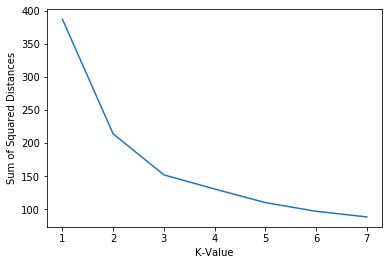

In [185]:
ks = np.arange(1,8)
inertias = []
for n in ks:
    # set number of clusters
    kclusters = n

    # run k-means clustering
    kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(clustering_data)

    # check cluster labels generated for each row in the dataframe
    kmeans.labels_[0:10] 
    inertias.append(kmeans.inertia_)

plt.plot(ks, inertias)
plt.xlabel('K-Value')
plt.ylabel('Sum of Squared Distances')

In [9]:
# set number of clusters
kclusters = 3

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(clustering_data)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 1, 1, 1, 2, 2, 2, 2, 2, 1], dtype=int32)

Add the cluster labels to the CHICAGO dataframe.

In [10]:
#CHICAGO = pd.read_csv('CHICAGO_CA_INFO.csv')

# add clustering labels

#CHICAGO.drop(columns='Unnamed: 0',inplace=True)
CHICAGO_clustered=pd.read_csv('CHICAGO_clustered.csv')
CHICAGO_clustered.drop(columns=['Unnamed: 0','Cluster Labels'],inplace=True)
CHICAGO_clustered.insert(0, 'Cluster Labels', kmeans.labels_)
CHICAGO_clustered

,Cluster Labels,ca,community_area_name,Average Performance Policy Level,Latitude,Longitude,per_capita_income_,hardship_index,Median Rent,Crime Rate,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,1,1,ROGERS PARK,2.333333,42.010531,-87.670748,23939,39.0,1350.0,0.026715,Beach,Mexican Restaurant,Sandwich Place,Park,Fast Food Restaurant
1,1,2,WEST RIDGE,1.125000,42.003548,-87.696243,23040,46.0,1250.0,0.016611,Indian Restaurant,Pakistani Restaurant,Grocery Store,Pizza Place,Convenience Store
2,1,3,UPTOWN,1.571429,41.966630,-87.655546,35787,20.0,1425.0,0.021683,Vietnamese Restaurant,Coffee Shop,Chinese Restaurant,Bar,Grocery Store
3,1,4,LINCOLN SQUARE,1.800000,41.975990,-87.689616,37524,17.0,1395.0,0.018986,Bar,Gym,Sandwich Place,Thai Restaurant,Coffee Shop
4,2,5,NORTH CENTER,1.166667,41.956107,-87.679160,57123,6.0,1925.0,0.014306,Bar,Pizza Place,Coffee Shop,Brewery,Restaurant
5,2,6,LAKE VIEW,1.363636,41.947050,-87.655429,60058,5.0,1900.0,0.018861,Pizza Place,Gay Bar,Bar,Sports Bar,Italian Restaurant
6,2,7,LINCOLN PARK,1.428571,41.940298,-87.638117,71551,2.0,1800.0,0.018904,Mexican Restaurant,Italian Restaurant,Grocery Store,Sushi Restaurant,Bar
7,2,8,NEAR NORTH SIDE,2.000000,41.900033,-87.634497,88669,1.0,1900.0,0.038012,Coffee Shop,Hotel,Italian Restaurant,Steakhouse,Gym / Fitness Center
8,2,9,EDISON PARK,1.000000,42.005734,-87.814016,40959,8.0,1750.0,0.008272,Park,Bar,Italian Restaurant,Pizza Place,Sandwich Place
9,1,10,NORWOOD PARK,1.142857,41.985590,-87.800582,32875,21.0,1750.0,0.009437,American Restaurant,Pizza Place,Park,Bar,Irish Pub


In [135]:
#CHICAGO_clustered = CHICAGO.merge(CHICAGO_SUMMARY[['ca','1st Most Common Venue', '2nd Most Common Venue','3rd Most Common Venue','4th Most Common Venue','5th Most Common Venue']])
CHICAGO_clustered.to_csv('CHICAGO_clustered.csv')

In [14]:
geolocator = Nominatim(user_agent='chi_explorer')
a = geolocator.geocode('Chicago, IL')
latitude = a.latitude
longitude = a.longitude

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(CHICAGO_clustered['Latitude'], CHICAGO_clustered['Longitude'], CHICAGO_clustered['community_area_name'], CHICAGO_clustered['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster],
        fill=True,
        fill_color=rainbow[cluster],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## <center> 9. Cluster Inspection <center>

In [136]:
CHICAGO_clustered = pd.read_csv('CHICAGO_clustered.csv')
CHICAGO_clustered.drop(columns='Unnamed: 0',inplace=True)
CHICAGO_clustered

,Cluster Labels,ca,community_area_name,Average Performance Policy Level,Latitude,Longitude,per_capita_income_,hardship_index,Median Rent,Crime Rate,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,2,1,ROGERS PARK,2.333333,42.010531,-87.670748,23939,39.0,1350.0,0.026715,Beach,Mexican Restaurant,Sandwich Place,Park,Fast Food Restaurant
1,2,2,WEST RIDGE,1.125000,42.003548,-87.696243,23040,46.0,1250.0,0.016611,Indian Restaurant,Pakistani Restaurant,Grocery Store,Pizza Place,Convenience Store
2,2,3,UPTOWN,1.571429,41.966630,-87.655546,35787,20.0,1425.0,0.021683,Vietnamese Restaurant,Coffee Shop,Chinese Restaurant,Bar,Grocery Store
3,2,4,LINCOLN SQUARE,1.800000,41.975990,-87.689616,37524,17.0,1395.0,0.018986,Bar,Gym,Sandwich Place,Thai Restaurant,Coffee Shop
4,0,5,NORTH CENTER,1.166667,41.956107,-87.679160,57123,6.0,1925.0,0.014306,Bar,Pizza Place,Coffee Shop,Brewery,Restaurant
5,0,6,LAKE VIEW,1.363636,41.947050,-87.655429,60058,5.0,1900.0,0.018861,Pizza Place,Gay Bar,Bar,Sports Bar,Italian Restaurant
6,0,7,LINCOLN PARK,1.428571,41.940298,-87.638117,71551,2.0,1800.0,0.018904,Mexican Restaurant,Italian Restaurant,Grocery Store,Sushi Restaurant,Bar
7,0,8,NEAR NORTH SIDE,2.000000,41.900033,-87.634497,88669,1.0,1900.0,0.038012,Coffee Shop,Hotel,Italian Restaurant,Steakhouse,Gym / Fitness Center
8,0,9,EDISON PARK,1.000000,42.005734,-87.814016,40959,8.0,1750.0,0.008272,Park,Bar,Italian Restaurant,Pizza Place,Sandwich Place
9,2,10,NORWOOD PARK,1.142857,41.985590,-87.800582,32875,21.0,1750.0,0.009437,American Restaurant,Pizza Place,Park,Bar,Irish Pub


### Cluster 0

In [193]:
cl_0 = CHICAGO_clustered[CHICAGO_clustered['Cluster Labels']==0].iloc[:,[1,2,3,6,7,8,9,10,11,12,13,14]]
print('---Cluster 0---')
print('Average Performance Policy Level = {:.2f}'.format(np.mean(cl_0['Average Performance Policy Level'])))
print('Average Per Capita Income = {:5.0f}'.format(np.mean(cl_0['per_capita_income_'])))
print('Average Hardship Index = {:2.1f}'.format(np.mean(cl_0['hardship_index'])))
print('Average Median Rent = {:4.1f}'.format(np.mean(cl_0['Median Rent'])))
print('Average Crime Rate = {:.3f}'.format(np.mean(cl_0['Crime Rate'])))
cl_0

---Cluster 0---
Average Performance Policy Level = 2.49
Average Per Capita Income = 15238
Average Hardship Index = 75.1
Average Median Rent = 1309.0
Average Crime Rate = 0.063


,ca,community_area_name,Average Performance Policy Level,per_capita_income_,hardship_index,Median Rent,Crime Rate,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
18,19,BELMONT CRAGIN,2.400000,15461,70.0,1500.0,0.020486,Mexican Restaurant,Pharmacy,Sandwich Place,American Restaurant,Nightclub
19,20,HERMOSA,2.500000,15089,71.0,1400.0,0.022490,Mexican Restaurant,Pizza Place,Discount Store,Grocery Store,Pharmacy
22,23,HUMBOLDT PARK,2.416667,13781,85.0,1572.5,0.053201,Grocery Store,Donut Shop,Latin American Restaurant,Liquor Store,Sandwich Place
24,25,AUSTIN,2.347826,15957,73.0,1020.0,0.060760,Fried Chicken Joint,Grocery Store,Sandwich Place,Seafood Restaurant,Mexican Restaurant
25,26,WEST GARFIELD PARK,2.500000,10934,92.0,985.0,0.130105,Fast Food Restaurant,Botanical Garden,Train Station,Shoe Store,Park
26,27,EAST GARFIELD PARK,2.076923,12961,83.0,1700.0,0.087818,Food,Train Station,Park,Discount Store,Diner
28,29,NORTH LAWNDALE,2.600000,12034,87.0,1200.0,0.090494,Fast Food Restaurant,Fried Chicken Joint,Park,Discount Store,Pizza Place
29,30,SOUTH LAWNDALE,2.000000,10402,96.0,1200.0,0.022378,Mexican Restaurant,Fast Food Restaurant,Bank,Pharmacy,Taco Place
35,36,OAKLAND,3.000000,19252,78.0,1700.0,0.035515,Beach,Park,Discount Store,Coffee Shop,Train Station
36,37,FULLER PARK,3.000000,10432,97.0,1380.0,0.143911,Park,Pizza Place,Train Station,Sandwich Place,Bus Station


### Cluster 1

In [194]:
cl_1 = CHICAGO_clustered[CHICAGO_clustered['Cluster Labels']==1].iloc[:,[1,2,3,6,7,8,9,10,11,12,13,14]]
print('---Cluster 1---')
print('Average Performance Policy Level = {:.2f}'.format(np.mean(cl_1['Average Performance Policy Level'])))
print('Average Per Capita Income = {:5.0f}'.format(np.mean(cl_1['per_capita_income_'])))
print('Average Hardship Index = {:2.1f}'.format(np.mean(cl_1['hardship_index'])))
print('Average Median Rent = {:4.1f}'.format(np.mean(cl_1['Median Rent'])))
print('Average Crime Rate = {:.3f}'.format(np.mean(cl_1['Crime Rate'])))
cl_1

---Cluster 1---
Average Performance Policy Level = 1.72
Average Per Capita Income = 25583
Average Hardship Index = 39.4
Average Median Rent = 1605.2
Average Crime Rate = 0.022


,ca,community_area_name,Average Performance Policy Level,per_capita_income_,hardship_index,Median Rent,Crime Rate,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,1,ROGERS PARK,2.333333,23939,39.0,1350.0,0.026715,Beach,Mexican Restaurant,Sandwich Place,Park,Fast Food Restaurant
1,2,WEST RIDGE,1.125000,23040,46.0,1250.0,0.016611,Indian Restaurant,Pakistani Restaurant,Grocery Store,Pizza Place,Convenience Store
2,3,UPTOWN,1.571429,35787,20.0,1425.0,0.021683,Vietnamese Restaurant,Coffee Shop,Chinese Restaurant,Bar,Grocery Store
3,4,LINCOLN SQUARE,1.800000,37524,17.0,1395.0,0.018986,Bar,Gym,Sandwich Place,Thai Restaurant,Coffee Shop
9,10,NORWOOD PARK,1.142857,32875,21.0,1750.0,0.009437,American Restaurant,Pizza Place,Park,Bar,Irish Pub
10,11,JEFFERSON PARK,1.500000,27751,25.0,1500.0,0.014138,Bar,Chinese Restaurant,Video Store,Park,Pharmacy
12,13,NORTH PARK,1.250000,26576,33.0,1325.0,0.017302,Coffee Shop,Bus Station,Park,Pizza Place,Korean Restaurant
13,14,ALBANY PARK,1.875000,21323,53.0,1395.0,0.016676,Coffee Shop,Sandwich Place,Mexican Restaurant,Chinese Restaurant,Park
14,15,PORTAGE PARK,1.666667,24336,35.0,1400.0,0.017354,Pizza Place,Bar,Pharmacy,Italian Restaurant,Ice Cream Shop
15,16,IRVING PARK,1.777778,27249,34.0,1400.0,0.018112,Bar,Sandwich Place,Coffee Shop,Donut Shop,Gym


### Cluster 2

In [195]:
cl_2 = CHICAGO_clustered[CHICAGO_clustered['Cluster Labels']==2].iloc[:,[1,2,3,6,7,8,9,10,11,12,13,14]]
print('---Cluster 2---')
print('Average Performance Policy Level = {:.2f}'.format(np.mean(cl_2['Average Performance Policy Level'])))
print('Average Per Capita Income = {:5.0f}'.format(np.mean(cl_2['per_capita_income_'])))
print('Average Hardship Index = {:2.1f}'.format(np.mean(cl_2['hardship_index'])))
print('Average Median Rent = {:4.1f}'.format(np.mean(cl_2['Median Rent'])))
print('Average Crime Rate = {:.3f}'.format(np.mean(cl_2['Crime Rate'])))
cl_2

---Cluster 2---
Average Performance Policy Level = 1.34
Average Per Capita Income = 57501
Average Hardship Index = 6.8
Average Median Rent = 2003.2
Average Crime Rate = 0.029


,ca,community_area_name,Average Performance Policy Level,per_capita_income_,hardship_index,Median Rent,Crime Rate,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
4,5,NORTH CENTER,1.166667,57123,6.0,1925.0,0.014306,Bar,Pizza Place,Coffee Shop,Brewery,Restaurant
5,6,LAKE VIEW,1.363636,60058,5.0,1900.0,0.018861,Pizza Place,Gay Bar,Bar,Sports Bar,Italian Restaurant
6,7,LINCOLN PARK,1.428571,71551,2.0,1800.0,0.018904,Mexican Restaurant,Italian Restaurant,Grocery Store,Sushi Restaurant,Bar
7,8,NEAR NORTH SIDE,2.000000,88669,1.0,1900.0,0.038012,Coffee Shop,Hotel,Italian Restaurant,Steakhouse,Gym / Fitness Center
8,9,EDISON PARK,1.000000,40959,8.0,1750.0,0.008272,Park,Bar,Italian Restaurant,Pizza Place,Sandwich Place
11,12,FOREST GLEN,1.000000,44164,11.0,1750.0,0.011304,Yoga Studio,Park,Grocery Store,Asian Restaurant,Fast Food Restaurant
23,24,WEST TOWN,1.777778,43198,10.0,2400.0,0.026792,Coffee Shop,Restaurant,Dive Bar,Bar,Ukrainian Restaurant
27,28,NEAR WEST SIDE,1.642857,44689,15.0,2504.0,0.046682,Stadium,Coffee Shop,Brewery,Sports Bar,Yoga Studio
31,32,LOOP,1.000000,65526,3.0,2000.0,0.072352,Hotel,Coffee Shop,Park,Garden,American Restaurant
32,33,NEAR SOUTH SIDE,1.000000,59077,7.0,2103.0,0.029975,Chinese Restaurant,Asian Restaurant,Park,Pizza Place,Hotel
